# Lab 1 — Image Representation and Data Exploration (Pumpkin Leaf Dataset)

**Lab Topics**
- Load and visualize image datasets
- Analyze image tensors, color spaces, and normalization
- Observe effects of basic augmentations
- Identify dataset bias and potential failure cases


## Config 

In [1]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt

import cv2
from PIL import Image

import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import make_grid

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("DEVICE:", DEVICE)

DATA_DIR = "/kaggle/input/pumpkin/Original/Original"
assert os.path.isdir(DATA_DIR), f"Dataset directory not found: {DATA_DIR}"
print("DATA_DIR:", DATA_DIR)
print("Subfolders:", os.listdir(DATA_DIR))


DEVICE: cuda
DATA_DIR: /kaggle/input/pumpkin/Original/Original
Subfolders: ['Powdery Mildew', 'Bacterial Leaf Spot', 'Healthy Leaf', 'Downy Mildew', 'Mosaic Disease']


## 2) Quick dataset sanity check

In [2]:
# Verify class folders exist
class_folders = sorted([d for d in os.listdir(DATA_DIR) if os.path.isdir(os.path.join(DATA_DIR, d))])
print("Detected classes:", class_folders)
print("Num classes:", len(class_folders))


Detected classes: ['Bacterial Leaf Spot', 'Downy Mildew', 'Healthy Leaf', 'Mosaic Disease', 'Powdery Mildew']
Num classes: 5


## 3) Helper utilities

In [3]:
def show_images_grid(images, titles=None, ncols=5, figsize=(14, 8)):
    n = len(images)
    nrows = int(np.ceil(n / ncols))
    plt.figure(figsize=figsize)
    for i, img in enumerate(images):
        plt.subplot(nrows, ncols, i+1)
        if isinstance(img, torch.Tensor):
            img = img.detach().cpu()
            if img.ndim == 3:
                img = img.permute(1,2,0)
            img = img.numpy()
        plt.imshow(img)
        plt.axis("off")
        if titles is not None:
            plt.title(titles[i], fontsize=9)
    plt.tight_layout()
    plt.show()

def tensor_stats(x: torch.Tensor, name="tensor"):
    x_ = x.detach().cpu()
    print(f"[{name}] shape={tuple(x_.shape)} dtype={x_.dtype}")
    print(f"  min={x_.min().item():.4f}, max={x_.max().item():.4f}, mean={x_.mean().item():.4f}, std={x_.std().item():.4f}")

def plot_channel_hist(img_rgb_uint8, title="RGB channel histograms"):
    plt.figure(figsize=(12,4))
    for i, label in enumerate(["R","G","B"]):
        hist = cv2.calcHist([img_rgb_uint8],[i],None,[256],[0,256]).flatten()
        plt.plot(hist, label=label)
    plt.title(title)
    plt.legend()
    plt.show()

def show_color_spaces(img_rgb_uint8, prefix=""):
    hsv = cv2.cvtColor(img_rgb_uint8, cv2.COLOR_RGB2HSV)
    lab = cv2.cvtColor(img_rgb_uint8, cv2.COLOR_RGB2LAB)

    images = [
        img_rgb_uint8,
        hsv[:,:,0], hsv[:,:,1], hsv[:,:,2],
        lab[:,:,0], lab[:,:,1], lab[:,:,2]
    ]
    titles = [
        f"{prefix}RGB",
        f"{prefix}HSV-H", f"{prefix}HSV-S", f"{prefix}HSV-V",
        f"{prefix}LAB-L", f"{prefix}LAB-A", f"{prefix}LAB-B"
    ]
    show_images_grid(images, titles=titles, ncols=4, figsize=(14,8))


## 4) Load dataset (ImageFolder) + visualize samples
We use `torchvision.datasets.ImageFolder` since the data is arranged as class-subfolders.


Classes: ['Bacterial Leaf Spot', 'Downy Mildew', 'Healthy Leaf', 'Mosaic Disease', 'Powdery Mildew']
Total images: 2000


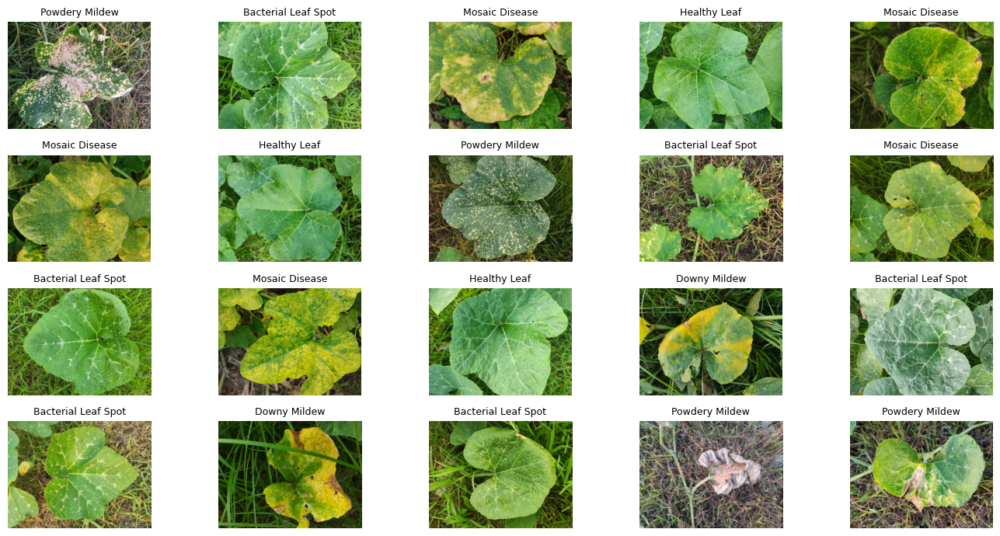

In [4]:
# Basic transform just to load as tensor (no resize yet)
tf_plain = transforms.Compose([
    transforms.ToTensor(),  # [C,H,W], float32 in [0,1]
])

dataset_plain = datasets.ImageFolder(DATA_DIR, transform=tf_plain)
class_names = dataset_plain.classes
print("Classes:", class_names)
print("Total images:", len(dataset_plain))

# Show a few random samples (raw sizes differ)
idxs = np.random.choice(len(dataset_plain), 20, replace=False)
imgs = []
titles = []
for i in idxs:
    x, y = dataset_plain[i]
    # Convert for matplotlib: CHW -> HWC
    imgs.append(x.permute(1,2,0).numpy())
    titles.append(class_names[y])
show_images_grid(imgs, titles=titles, ncols=5, figsize=(14,7))


## 5) Analyze image tensors + normalization

**Analyze Image Tensors and Normalization**

We will:
- Inspect shape, dtype, value range
- Compute dataset mean/std (for normalization)
- Visualize the effect of normalization (via de-normalization for display)


### 5.1 Tensor inspection on a single sample

In [5]:
x, y = dataset_plain[np.random.randint(len(dataset_plain))]
tensor_stats(x, "Raw image tensor")
print("Label:", class_names[y])


[Raw image tensor] shape=(3, 800, 600) dtype=torch.float32
  min=0.0000, max=0.9686, mean=0.3657, std=0.2220
Label: Mosaic Disease


### 5.2 Compute dataset mean/std (fast approximation)

In [6]:
# Approximate mean/std by sampling N images (sufficient for teaching)
N = min(500, len(dataset_plain))
sample_idxs = np.random.choice(len(dataset_plain), N, replace=False)

channel_sum = torch.zeros(3)
channel_sum_sq = torch.zeros(3)
pixel_count = 0

for idx in sample_idxs:
    x, _ = dataset_plain[idx]  # [C,H,W] in [0,1]
    c, h, w = x.shape
    pixel_count += h*w
    channel_sum += x.view(c, -1).sum(dim=1)
    channel_sum_sq += (x.view(c, -1) ** 2).sum(dim=1)

mean = channel_sum / pixel_count
std = (channel_sum_sq / pixel_count - mean**2).sqrt()

print("Estimated dataset mean:", mean.tolist())
print("Estimated dataset std :", std.tolist())


Estimated dataset mean: [0.40144455432891846, 0.5087255239486694, 0.21169322729110718]
Estimated dataset std : [0.20620295405387878, 0.2074742168188095, 0.16433779895305634]


### 5.3 Apply normalization + show effect

[Raw] shape=(3, 599, 800) dtype=torch.float32
  min=0.0000, max=1.0000, mean=0.2442, std=0.1922
[Normalized] shape=(3, 599, 800) dtype=torch.float32
  min=-2.4520, max=4.5821, mean=-0.6612, std=0.9002


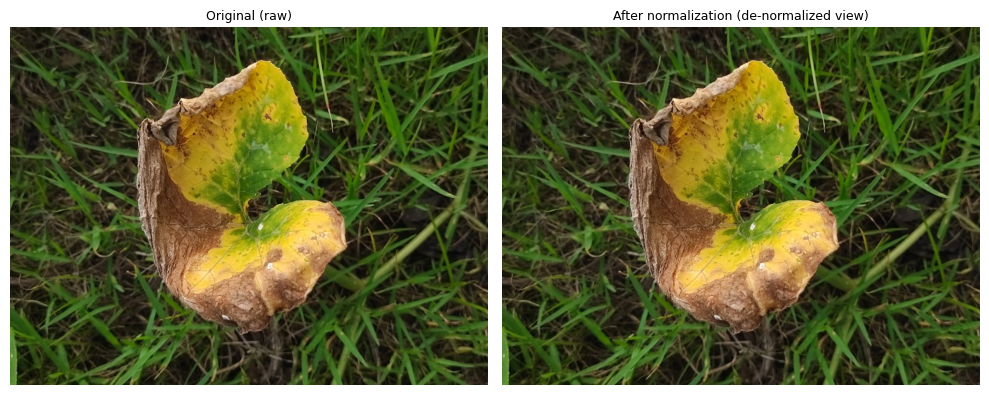

In [7]:
MEAN = tuple(mean.tolist())
STD  = tuple(std.tolist())

tf_norm = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD)
])

dataset_norm = datasets.ImageFolder(DATA_DIR, transform=tf_norm)

# Pick same index and compare
idx = np.random.randint(len(dataset_plain))
x_raw, y = dataset_plain[idx]
x_norm, _ = dataset_norm[idx]

tensor_stats(x_raw, "Raw")
tensor_stats(x_norm, "Normalized")

# De-normalize for visualization
x_den = x_norm.clone()
for c in range(3):
    x_den[c] = x_den[c] * STD[c] + MEAN[c]
x_den = torch.clamp(x_den, 0, 1)

show_images_grid(
    [x_raw.permute(1,2,0).numpy(), x_den.permute(1,2,0).numpy()],
    titles=["Original (raw)", "After normalization (de-normalized view)"],
    ncols=2,
    figsize=(10,4)
)


## 6) Color spaces (RGB / HSV / LAB) + histograms

We inspect:
- RGB channel histogram
- HSV decomposition (H/S/V)
- LAB decomposition (L/A/B)


### 6.1 Color space visualization on one image

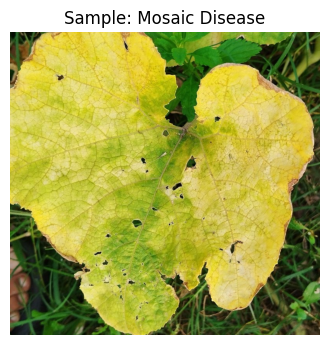

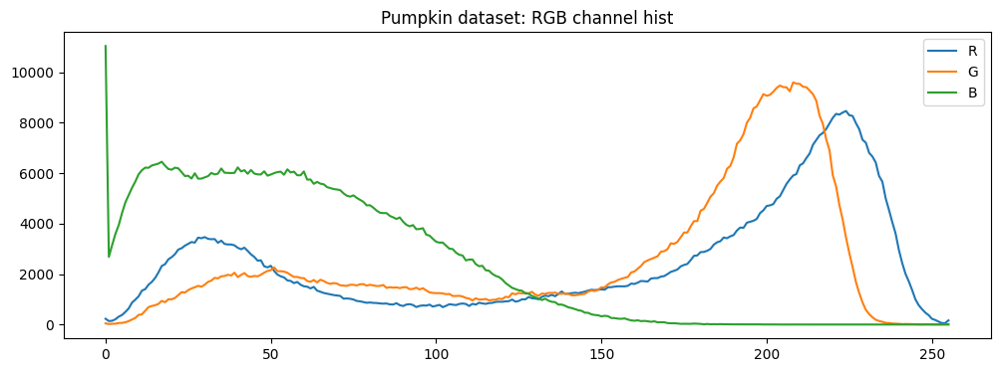

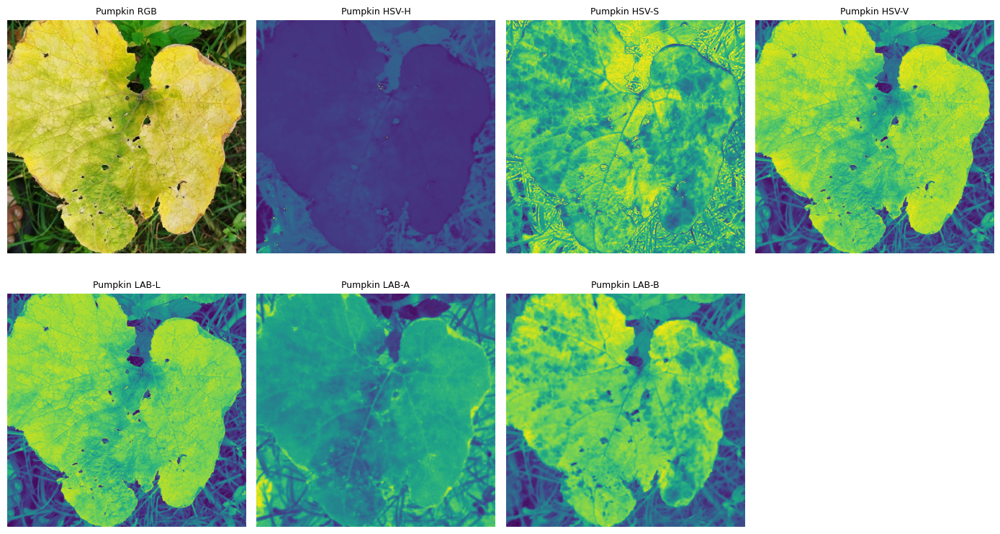

In [8]:
# Use PIL to load original-resolution RGB image for OpenCV analysis
img_path, label = dataset_plain.samples[np.random.randint(len(dataset_plain.samples))]
img_pil = Image.open(img_path).convert("RGB")
img_rgb = np.array(img_pil)  # HxWx3, uint8, RGB

plt.figure(figsize=(4,4))
plt.imshow(img_rgb)
plt.title(f"Sample: {class_names[label]}")
plt.axis("off")
plt.show()

plot_channel_hist(img_rgb, title="Pumpkin dataset: RGB channel hist")
show_color_spaces(img_rgb, prefix="Pumpkin ")


## 7) Basic augmentations

We demonstrate common basic augmentations used in training:
- Horizontal flip
- Small rotation
- Random crop/resize
- Brightness/contrast jitter

### 7.1 Build resized dataset for consistent visualization

In [9]:
IMG_SIZE = 224

tf_vis = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor()
])

dataset_vis = datasets.ImageFolder(DATA_DIR, transform=tf_vis)


### 7.2 Compare original vs augmented outputs

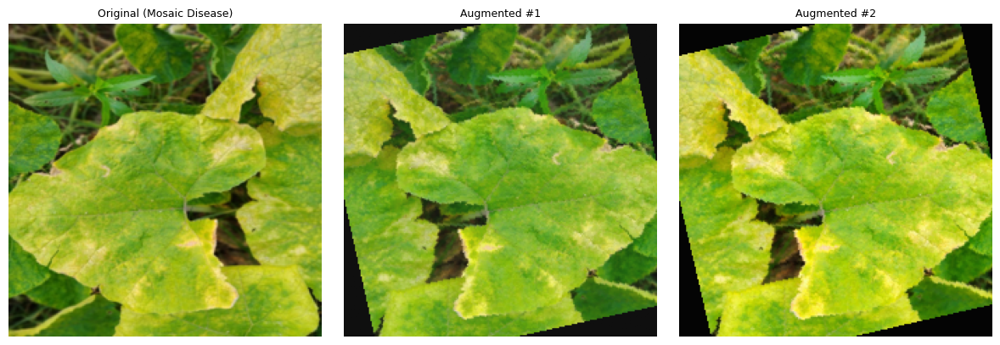

In-lab discussion prompts:
1) Does rotation change the label meaning? Why/why not?
2) Does color jitter ever hide disease spots?
3) Would vertical flip be valid for leaf images? Discuss.


In [10]:
tf_aug_basic = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=1.0),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.25, contrast=0.25, saturation=0.15, hue=0.03),
    transforms.ToTensor()
])

dataset_aug = datasets.ImageFolder(DATA_DIR, transform=tf_aug_basic)

idx = np.random.randint(len(dataset_vis))

x0, y0 = dataset_vis[idx]
x1, _  = dataset_aug[idx]
x2, _  = dataset_aug[idx]  # run twice to show randomness

show_images_grid(
    [x0.permute(1,2,0).numpy(), x1.permute(1,2,0).numpy(), x2.permute(1,2,0).numpy()],
    titles=[f"Original ({class_names[y0]})", "Augmented #1", "Augmented #2"],
    ncols=3,
    figsize=(12,4)
)

print("In-lab discussion prompts:")
print("1) Does rotation change the label meaning? Why/why not?")
print("2) Does color jitter ever hide disease spots?")
print("3) Would vertical flip be valid for leaf images? Discuss.")


## 8) Dataset bias + potential failure cases

We check:
1) **Class imbalance** (counts per class)
2) **Resolution bias** (are some classes mostly high/low resolution?)
3) **Lighting/color bias** (are some classes systematically brighter/darker?)
4) **Potential failure cases**:
   - background clutter
   - strong lighting / shadows
   - occlusion (overlapping leaves)
   - early-stage disease (subtle symptoms)
   - confusing patterns across disease categories

### 8.1 Class distribution

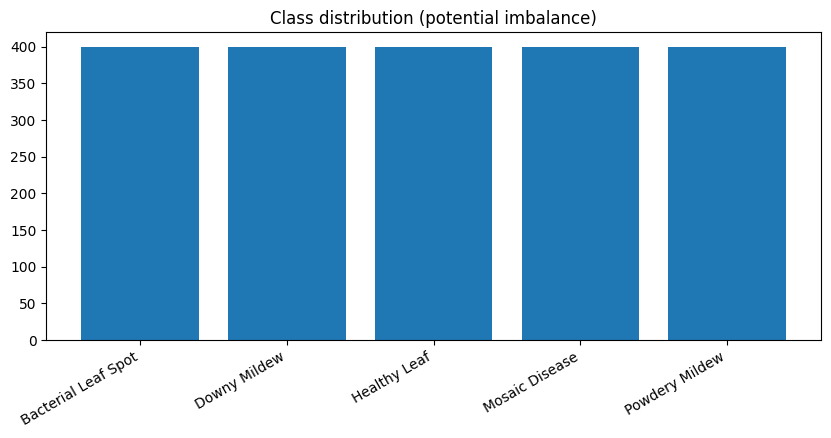

{'Bacterial Leaf Spot': 400, 'Downy Mildew': 400, 'Healthy Leaf': 400, 'Mosaic Disease': 400, 'Powdery Mildew': 400}

Bias prompt:
- If one class has fewer samples, which metric will be affected first (precision/recall)?


In [11]:
from collections import Counter

labels = [y for _, y in dataset_plain.samples]
counts = Counter(labels)
counts_named = {class_names[k]: v for k, v in counts.items()}

plt.figure(figsize=(10,4))
plt.bar(list(counts_named.keys()), list(counts_named.values()))
plt.xticks(rotation=30, ha="right")
plt.title("Class distribution (potential imbalance)")
plt.show()

print(counts_named)
print("\nBias prompt:")
print("- If one class has fewer samples, which metric will be affected first (precision/recall)?")


### 8.2 Resolution bias and brightness bias

/tmp/ipykernel_24/1596035314.py:23: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=class_names, showfliers=False)


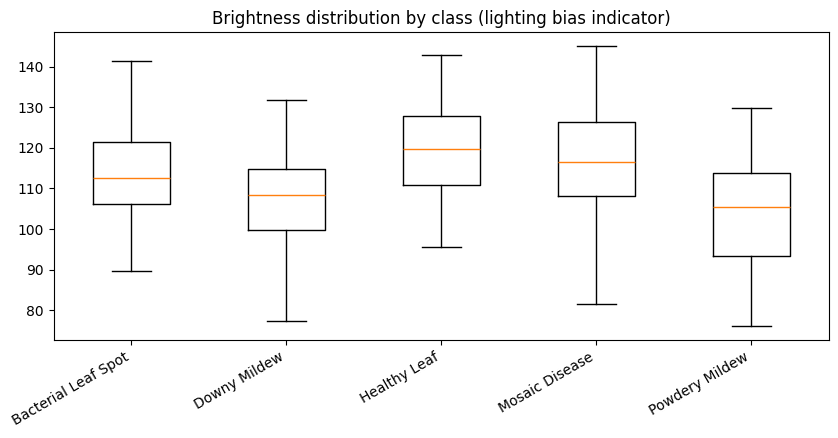

Bacterial Leaf Spot  mean(W,H)=(800.0, 599.1)
Downy Mildew         mean(W,H)=(800.0, 599.7)
Healthy Leaf         mean(W,H)=(800.0, 599.4)
Mosaic Disease       mean(W,H)=(699.6, 708.3)
Powdery Mildew       mean(W,H)=(797.3, 604.6)


In [12]:
# Analyze a sample of images per class for resolution + brightness statistics
N = min(400, len(dataset_plain.samples))
sample = random.sample(dataset_plain.samples, N)

# Store per-class stats
stats = {cls: {"w": [], "h": [], "brightness": []} for cls in class_names}

for path, y in sample:
    img = Image.open(path).convert("RGB")
    w, h = img.size
    img_np = np.array(img)
    # brightness proxy: mean of grayscale
    gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
    b = float(gray.mean())
    cls = class_names[y]
    stats[cls]["w"].append(w)
    stats[cls]["h"].append(h)
    stats[cls]["brightness"].append(b)

# Plot brightness distribution (box plot style using matplotlib)
plt.figure(figsize=(10,4))
data = [stats[cls]["brightness"] for cls in class_names]
plt.boxplot(data, labels=class_names, showfliers=False)
plt.xticks(rotation=30, ha="right")
plt.title("Brightness distribution by class (lighting bias indicator)")
plt.show()

# Plot resolution (average)
avg_wh = [(np.mean(stats[cls]["w"]), np.mean(stats[cls]["h"])) for cls in class_names]
for cls, (mw, mh) in zip(class_names, avg_wh):
    print(f"{cls:20s} mean(W,H)=({mw:.1f}, {mh:.1f})")


### 8.3 Failure-case mining: show “hard examples” by simple heuristics

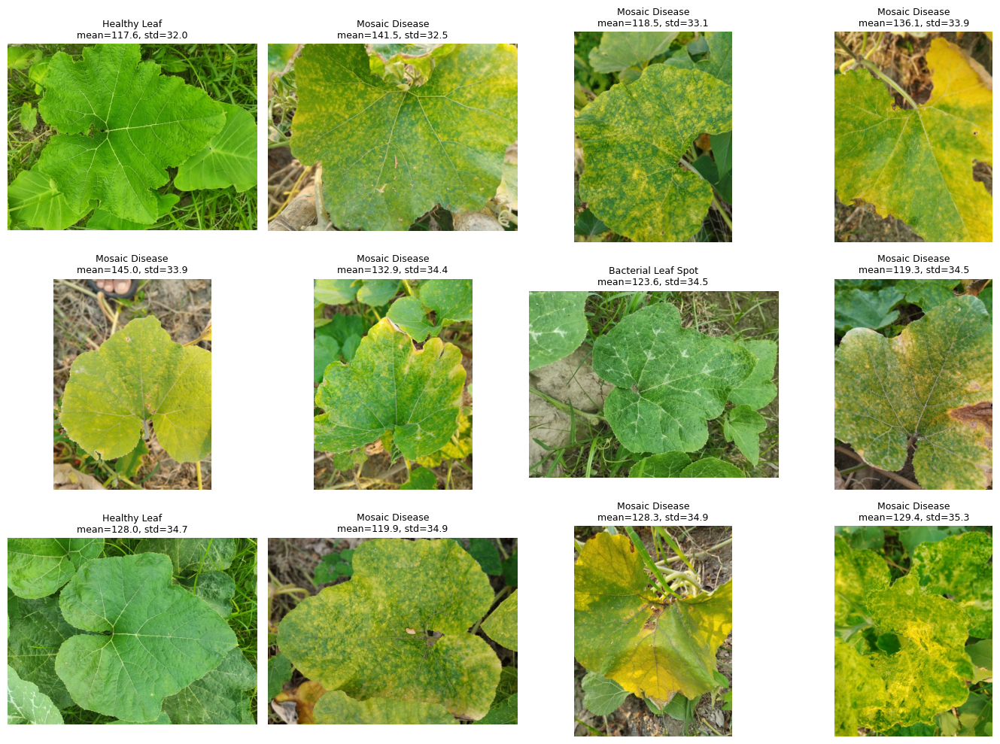

Failure-case discussion prompts:
1) Which images have shadows/background clutter?
2) Which images show subtle symptoms (early-stage disease)?
3) Which pairs of classes look visually similar (likely confusion)?


In [13]:
# Heuristic: select images with very low brightness or very low contrast (hard cases)
def contrast_score(img_rgb_uint8):
    gray = cv2.cvtColor(img_rgb_uint8, cv2.COLOR_RGB2GRAY)
    return float(gray.std())

records = []
for path, y in random.sample(dataset_plain.samples, min(600, len(dataset_plain.samples))):
    img = np.array(Image.open(path).convert("RGB"))
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    b = float(gray.mean())
    c = float(gray.std())
    records.append((path, y, b, c))

# Sort by low contrast then low brightness
records_sorted = sorted(records, key=lambda t: (t[3], t[2]))

hard = records_sorted[:12]  # 12 hard examples
imgs = []
titles = []
for path, y, b, c in hard:
    img = np.array(Image.open(path).convert("RGB"))
    imgs.append(img)
    titles.append(f"{class_names[y]}\nmean={b:.1f}, std={c:.1f}")

show_images_grid(imgs, titles=titles, ncols=4, figsize=(14,10))

print("Failure-case discussion prompts:")
print("1) Which images have shadows/background clutter?")
print("2) Which images show subtle symptoms (early-stage disease)?")
print("3) Which pairs of classes look visually similar (likely confusion)?")


## 9) Advanced Augmentation (Beyond Basics)

In addition to basic augmentations (flip/rotation/color jitter), advanced augmentation can improve robustness under:
- illumination changes (field sunlight, shadows)
- sensor noise (mobile cameras)
- motion blur / focus issues
- partial occlusion (overlapping leaves)
- scale variability (near/far shots)

We will demonstrate advanced augmentations in **Albumentations**, including:
- Shift/Scale/Rotate (geometric invariance)
- CLAHE (contrast normalization, LAB space)
- Gaussian noise / blur (sensor realism)
- CoarseDropout (occlusion simulation / Cutout)
- RandomShadow / RandomFog (field-like lighting artifacts)
- Perspective transform (camera angle changes)

**Discussion prompts**
- Which transforms are label-preserving for leaf disease classification?
- Which transforms risk destroying disease cues (e.g., too much blur/contrast)?

/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/tmp/ipykernel_24/204284151.py:29: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(5.0, 25.0), p=1.0),
/tmp/ipykernel_24/204284151.py:32: UserWarning: Argument(s) 'max_holes, max_height, max_width, fill_value' are not valid for transform CoarseDropout
  A.CoarseDropout(max_holes=6, max_height=28, max_width=28, fill_value=0, p=0.5),


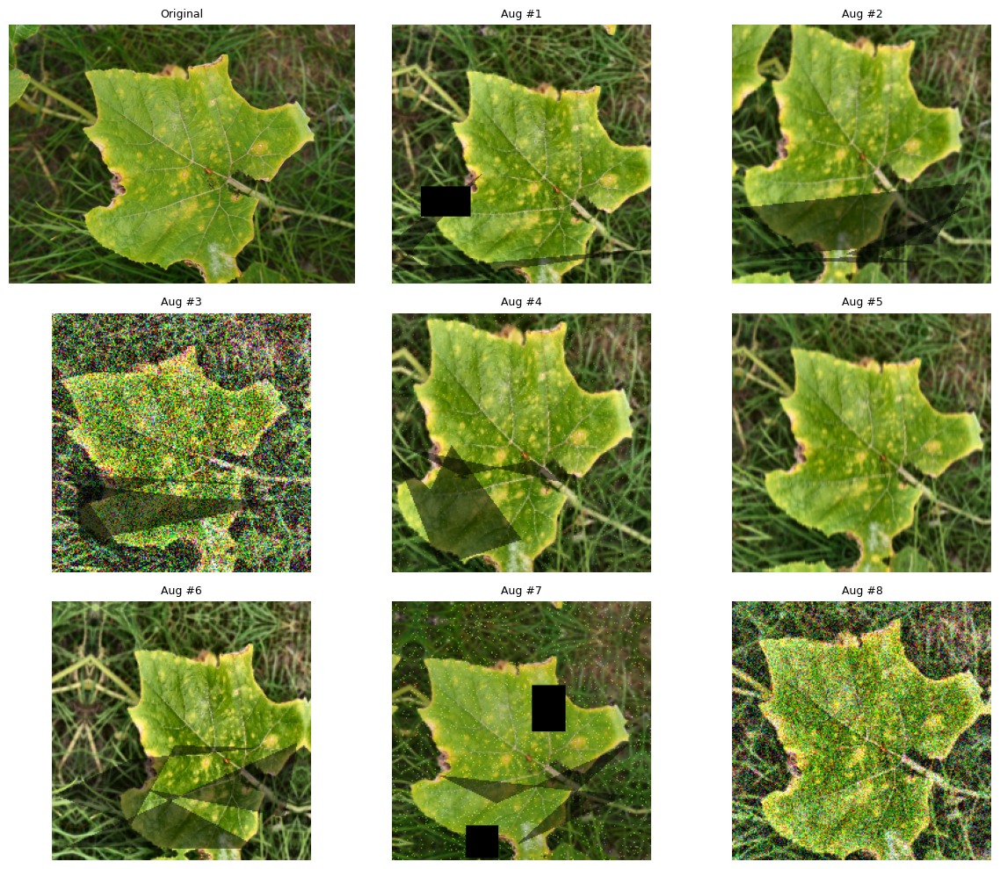

Advanced augmentation analysis prompts:
1) Which augmentations mimic real field conditions (shadow, noise, blur)?
2) Which ones might remove disease symptoms (too strong blur/CLAHE)?
3) If accuracy drops, which augmentation would you reduce first and why?


In [14]:
# =========================================================
# 10.1 Advanced Augmentation Demo (Albumentations)
# =========================================================

# Install if needed (usually works in Kaggle)
try:
    import albumentations as A
except ImportError:
    !pip -q install albumentations opencv-python
    import albumentations as A

def load_rgb_uint8(path):
    img = np.array(Image.open(path).convert("RGB"))
    return img  # HxWx3 uint8 RGB

# Pick one image
img_path, y = random.choice(dataset_plain.samples)
img = load_rgb_uint8(img_path)

advanced_aug = A.Compose([
    A.RandomResizedCrop(size=(IMG_SIZE, IMG_SIZE), scale=(0.7, 1.0), ratio=(0.85, 1.15), p=1.0),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.15, rotate_limit=18, border_mode=cv2.BORDER_REFLECT_101, p=1.0),
    A.CLAHE(clip_limit=2.0, tile_grid_size=(8,8), p=0.8),
    A.OneOf([
        A.GaussianBlur(blur_limit=(3,5), p=1.0),
        A.MotionBlur(blur_limit=5, p=1.0),
    ], p=0.5),
    A.OneOf([
        A.GaussNoise(var_limit=(5.0, 25.0), p=1.0),
        A.ISONoise(color_shift=(0.01,0.05), intensity=(0.1,0.3), p=1.0),
    ], p=0.5),
    A.CoarseDropout(max_holes=6, max_height=28, max_width=28, fill_value=0, p=0.5),
    A.RandomShadow(p=0.3),
])

# Generate multiple augmented views to show diversity
aug_views = []
titles = []
for k in range(8):
    aug = advanced_aug(image=img)["image"]
    aug_views.append(aug)
    titles.append(f"Aug #{k+1}")

# Also show original
show_images_grid([img] + aug_views, titles=["Original"] + titles, ncols=3, figsize=(12,10))

print("Advanced augmentation analysis prompts:")
print("1) Which augmentations mimic real field conditions (shadow, noise, blur)?")
print("2) Which ones might remove disease symptoms (too strong blur/CLAHE)?")
print("3) If accuracy drops, which augmentation would you reduce first and why?")


## 10) MixUp, CutMix, and Related Augmentations (Classification-Focused)

These are *sample-level* augmentations that combine two images and (soft) combine their labels.

**MixUp**
- Creates a convex combination of two images:  
  **x̃ = λx₁ + (1−λ)x₂**
- Labels become soft:  
  **ỹ = λy₁ + (1−λ)y₂**
- Helps: smoother decision boundaries, less overfitting, robustness to label noise

**CutMix**
- Cuts a patch from image 2 and pastes it into image 1
- The label mixing ratio is proportional to visible area:
  **λ = 1 − (patch_area / image_area)**

**Related augmentations (often used together)**
- **Random Erasing** (Torchvision): removes a random region (occlusion robustness)
- **CutOut/CoarseDropout** (Albumentations): similar to erasing, configurable holes

**Important note (for students)**
MixUp/CutMix are mainly for *classification training*. For detection/segmentation they require label-aware versions.


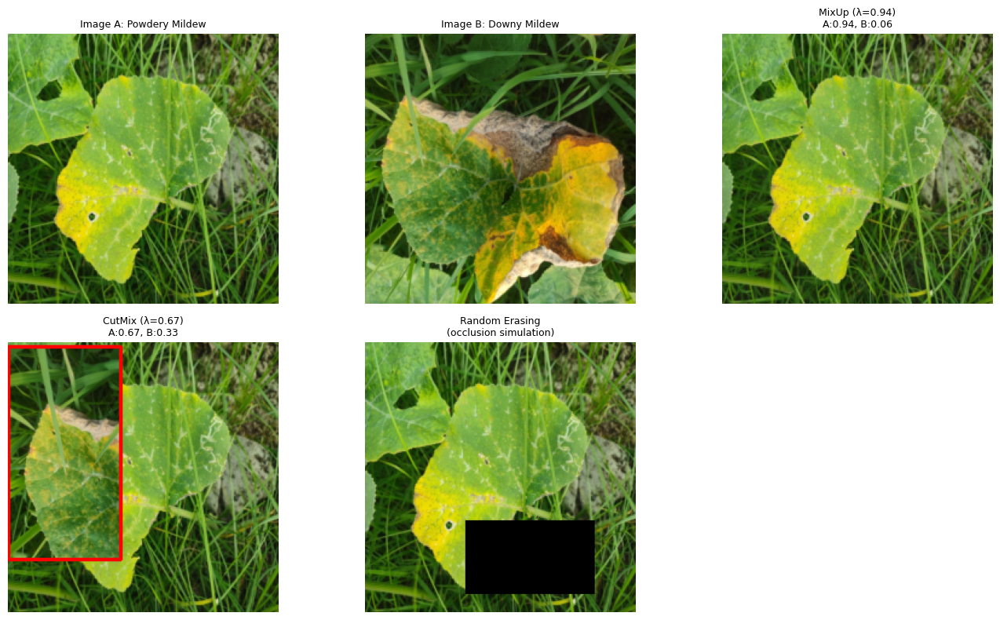

Teaching notes:
1) MixUp blends textures globally; CutMix preserves local patches.
2) Random Erasing is a simpler occlusion-based augmentation.
3) MixUp/CutMix change labels into soft targets (important for training loss).


In [15]:
# =========================================================
# MixUp + CutMix + Related Augmentations (Visualization)
# =========================================================

import math
from torchvision.transforms.functional import to_pil_image

# Use a dedicated dataset with fixed size tensors for this demo
IMG_SIZE = 224

tf_for_mix = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),  # [C,H,W] in [0,1]
])

dataset_mix = datasets.ImageFolder(DATA_DIR, transform=tf_for_mix)
class_names = dataset_mix.classes

def one_hot(y, num_classes):
    v = torch.zeros(num_classes, dtype=torch.float32)
    v[y] = 1.0
    return v

def sample_two(dataset):
    i1, i2 = random.sample(range(len(dataset)), 2)
    x1, y1 = dataset[i1]
    x2, y2 = dataset[i2]
    return x1, y1, x2, y2

def mixup(x1, y1, x2, y2, alpha=0.4):
    # lambda ~ Beta(alpha, alpha)
    lam = np.random.beta(alpha, alpha) if alpha > 0 else 1.0
    x = lam * x1 + (1 - lam) * x2
    return x, lam, y1, y2

def rand_bbox(W, H, lam):
    # CutMix bounding box based on lambda
    cut_rat = math.sqrt(1.0 - lam)
    cut_w = int(W * cut_rat)
    cut_h = int(H * cut_rat)

    cx = np.random.randint(W)
    cy = np.random.randint(H)

    x1 = np.clip(cx - cut_w // 2, 0, W)
    y1 = np.clip(cy - cut_h // 2, 0, H)
    x2 = np.clip(cx + cut_w // 2, 0, W)
    y2 = np.clip(cy + cut_h // 2, 0, H)
    return x1, y1, x2, y2

def cutmix(x1, y1, x2, y2, alpha=0.4):
    lam = np.random.beta(alpha, alpha) if alpha > 0 else 1.0
    C, H, W = x1.shape
    bbx1, bby1, bbx2, bby2 = rand_bbox(W, H, lam)

    x = x1.clone()
    x[:, bby1:bby2, bbx1:bbx2] = x2[:, bby1:bby2, bbx1:bbx2]

    # Adjust lambda to match actual patch area
    patch_area = (bbx2 - bbx1) * (bby2 - bby1)
    lam_adj = 1.0 - patch_area / (W * H)

    return x, lam_adj, (bbx1, bby1, bbx2, bby2), y1, y2

# Random Erasing (Torchvision) - apply AFTER tensor creation
random_erasing = transforms.RandomErasing(
    p=1.0, scale=(0.05, 0.18), ratio=(0.3, 3.3), value=0
)

# ---- Demo on two random images ----
x1, y1, x2, y2 = sample_two(dataset_mix)

x_mix, lam_mix, ya, yb = mixup(x1, y1, x2, y2, alpha=0.4)
x_cmx, lam_cmx, bbox, ya2, yb2 = cutmix(x1, y1, x2, y2, alpha=0.4)

# Random erasing example
x_erase = random_erasing(x1.clone())

# Prepare visualization (convert tensors to HWC numpy)
def t2np(x):
    return x.permute(1,2,0).clamp(0,1).cpu().numpy()

img_list = [
    t2np(x1), t2np(x2),
    t2np(x_mix),
    t2np(x_cmx),
    t2np(x_erase),
]

titles = [
    f"Image A: {class_names[y1]}",
    f"Image B: {class_names[y2]}",
    f"MixUp (λ={lam_mix:.2f})\nA:{lam_mix:.2f}, B:{1-lam_mix:.2f}",
    f"CutMix (λ={lam_cmx:.2f})\nA:{lam_cmx:.2f}, B:{1-lam_cmx:.2f}",
    "Random Erasing\n(occlusion simulation)"
]

# Draw CutMix bbox on the CutMix image for explanation
bbx1, bby1, bbx2, bby2 = bbox
cmx_vis = (img_list[3] * 255).astype(np.uint8).copy()
cv2.rectangle(cmx_vis, (bbx1, bby1), (bbx2, bby2), (255, 0, 0), 2)  # RGB red box
img_list[3] = cmx_vis

show_images_grid(img_list, titles=titles, ncols=3, figsize=(14,8))

print("Teaching notes:")
print("1) MixUp blends textures globally; CutMix preserves local patches.")
print("2) Random Erasing is a simpler occlusion-based augmentation.")
print("3) MixUp/CutMix change labels into soft targets (important for training loss).")


## 11A) Batch Preprocessing (Save Processed Images)

We will batch-process the dataset with a consistent preprocessing pipeline and write outputs to:
- `/kaggle/working/preprocessed/<class_name>/...`

Preprocessing example:
- Resize to 224×224
- Optional CLAHE (contrast normalization in LAB)
- Optional gamma correction

This is useful for:
- standardizing resolution
- reducing lighting variation
- preparing a clean dataset for later training notebooks


Saved counts per class (preprocessed):
{'Bacterial Leaf Spot': 80, 'Downy Mildew': 80, 'Healthy Leaf': 80, 'Mosaic Disease': 80, 'Powdery Mildew': 80}


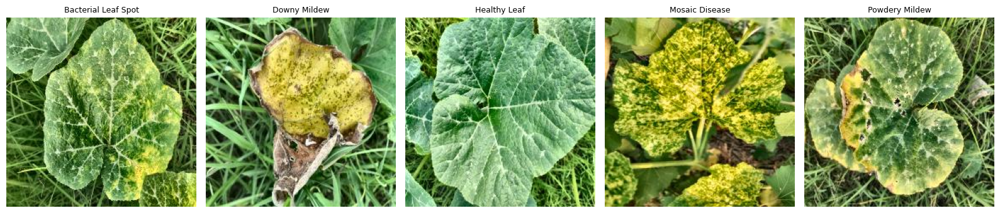

In [16]:
# =========================================================
# 11A.1 Batch Preprocess + Save
# =========================================================

OUT_PREP_DIR = "/kaggle/working/preprocessed"
os.makedirs(OUT_PREP_DIR, exist_ok=True)

def clahe_lab_rgb(img_rgb_uint8, clip=2.0, grid=(8,8)):
    lab = cv2.cvtColor(img_rgb_uint8, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=grid)
    l2 = clahe.apply(l)
    lab2 = cv2.merge([l2, a, b])
    out = cv2.cvtColor(lab2, cv2.COLOR_LAB2RGB)
    return out

def gamma_rgb(img_rgb_uint8, gamma=0.9):
    x = img_rgb_uint8.astype(np.float32) / 255.0
    x = np.power(x, gamma)
    return (x * 255).clip(0,255).astype(np.uint8)

def preprocess_pipeline(img_rgb_uint8, size=224, use_clahe=True, use_gamma=True):
    img = cv2.resize(img_rgb_uint8, (size, size), interpolation=cv2.INTER_AREA)
    if use_clahe:
        img = clahe_lab_rgb(img, clip=2.0, grid=(8,8))
    if use_gamma:
        img = gamma_rgb(img, gamma=0.9)
    return img

# Process only a subset for lab speed (adjust as needed)
MAX_PER_CLASS = 80  # increase if you want full dataset processing

counts_saved = {cls: 0 for cls in class_names}

for path, y in dataset_plain.samples:
    cls = class_names[y]
    if counts_saved[cls] >= MAX_PER_CLASS:
        continue

    img = load_rgb_uint8(path)
    out = preprocess_pipeline(img, size=IMG_SIZE, use_clahe=True, use_gamma=True)

    # Make class output dir
    cls_dir = os.path.join(OUT_PREP_DIR, cls)
    os.makedirs(cls_dir, exist_ok=True)

    # Save with original filename stem
    fname = os.path.basename(path)
    out_path = os.path.join(cls_dir, fname)
    Image.fromarray(out).save(out_path)

    counts_saved[cls] += 1

print("Saved counts per class (preprocessed):")
print(counts_saved)

# Visualize a few outputs
sample_out_paths = []
sample_titles = []
for cls in class_names:
    cls_dir = os.path.join(OUT_PREP_DIR, cls)
    if os.path.isdir(cls_dir):
        files = sorted(os.listdir(cls_dir))
        if len(files) > 0:
            p = os.path.join(cls_dir, random.choice(files))
            sample_out_paths.append(p)
            sample_titles.append(cls)

imgs = [np.array(Image.open(p).convert("RGB")) for p in sample_out_paths]
show_images_grid(imgs, titles=sample_titles, ncols=5, figsize=(16,4))


## 11B) Batch Augmentation (Save Augmented Images)

We will generate augmented images and save them to:
- `/kaggle/working/augmented/<class_name>/...`

This demonstrates how augmentation can expand dataset diversity.
We will:
- create `AUG_PER_IMAGE` augmented copies per input image
- keep augmentations label-preserving for leaf disease classification


/tmp/ipykernel_24/2501368017.py:17: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(5.0, 20.0), p=1.0),
/tmp/ipykernel_24/2501368017.py:20: UserWarning: Argument(s) 'max_holes, max_height, max_width, fill_value' are not valid for transform CoarseDropout
  A.CoarseDropout(max_holes=4, max_height=24, max_width=24, fill_value=0, p=0.3),


Source images used per class:
{'Bacterial Leaf Spot': 50, 'Downy Mildew': 50, 'Healthy Leaf': 50, 'Mosaic Disease': 50, 'Powdery Mildew': 50}

Augmented images saved per class:
{'Bacterial Leaf Spot': 100, 'Downy Mildew': 100, 'Healthy Leaf': 100, 'Mosaic Disease': 100, 'Powdery Mildew': 100}


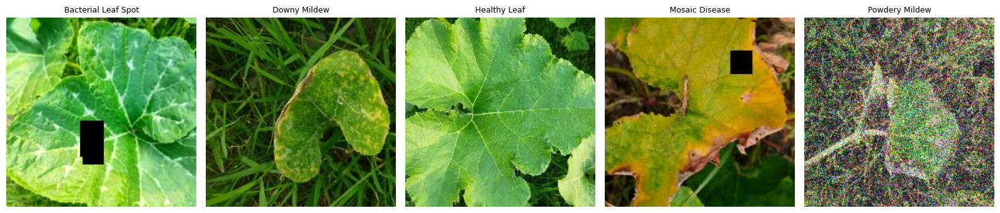


Augmentation discussion prompts:
1) Do augmented images still look like the same disease class?
2) Which augmentations increase robustness without changing semantics?
3) If a model overfits to background, what augmentations help reduce that?


In [17]:
# =========================================================
# 11B.1 Batch Augmentation + Save
# =========================================================

OUT_AUG_DIR = "/kaggle/working/augmented"
os.makedirs(OUT_AUG_DIR, exist_ok=True)

AUG_PER_IMAGE = 2          # number of augmented variants per image
MAX_PER_CLASS = 50         # how many source images per class to augment (for lab speed)

aug_pipeline = A.Compose([
    A.RandomResizedCrop(size=(IMG_SIZE, IMG_SIZE), scale=(0.75, 1.0), ratio=(0.9, 1.1), p=1.0),
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.12, rotate_limit=15, border_mode=cv2.BORDER_REFLECT_101, p=0.8),
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.12, hue=0.03, p=0.8),
    A.OneOf([
        A.GaussNoise(var_limit=(5.0, 20.0), p=1.0),
        A.GaussianBlur(blur_limit=(3,5), p=1.0),
    ], p=0.3),
    A.CoarseDropout(max_holes=4, max_height=24, max_width=24, fill_value=0, p=0.3),
])

counts_src = {cls: 0 for cls in class_names}
counts_aug = {cls: 0 for cls in class_names}

for path, y in dataset_plain.samples:
    cls = class_names[y]
    if counts_src[cls] >= MAX_PER_CLASS:
        continue

    img = load_rgb_uint8(path)

    # Save augmented copies
    cls_dir = os.path.join(OUT_AUG_DIR, cls)
    os.makedirs(cls_dir, exist_ok=True)

    base = os.path.splitext(os.path.basename(path))[0]
    for k in range(AUG_PER_IMAGE):
        out = aug_pipeline(image=img)["image"]
        out = cv2.resize(out, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)

        out_name = f"{base}_aug{k+1}.jpg"
        out_path = os.path.join(cls_dir, out_name)
        Image.fromarray(out).save(out_path)
        counts_aug[cls] += 1

    counts_src[cls] += 1

print("Source images used per class:")
print(counts_src)
print("\nAugmented images saved per class:")
print(counts_aug)

# Visualize a few augmented outputs
sample_aug_paths = []
sample_aug_titles = []
for cls in class_names:
    cls_dir = os.path.join(OUT_AUG_DIR, cls)
    if os.path.isdir(cls_dir):
        files = sorted(os.listdir(cls_dir))
        if len(files) > 0:
            p = os.path.join(cls_dir, random.choice(files))
            sample_aug_paths.append(p)
            sample_aug_titles.append(cls)

imgs = [np.array(Image.open(p).convert("RGB")) for p in sample_aug_paths]
show_images_grid(imgs, titles=sample_aug_titles, ncols=5, figsize=(16,4))

print("\nAugmentation discussion prompts:")
print("1) Do augmented images still look like the same disease class?")
print("2) Which augmentations increase robustness without changing semantics?")
print("3) If a model overfits to background, what augmentations help reduce that?")
